In [1]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score

In [2]:
#Read csv file, displaying original number of features
df = pd.read_csv("Alzheimers_Proj_DataSet_Original.csv",low_memory=False)
print("Original number of columns",len(df.columns))

Original number of columns 688


In [3]:
df = df.drop(columns=['LOGIDAY','LOGIMO','LOGIYR','CVDIMAG1','MOMOPARK','NACCIMCI','NACCNORM','NACCADGC','NACCID','NACCIDEM','NACCDIMP','NACCMAGE','NACCAGE','NACCFDYS','NACCWNDW','NACCAHTN','NACCHTNC','NACCACEI','NACCAAAS','NACCBETA','NACCCCBS','NACCDIUR','NACCVASD','NACCANGI','NACCLIPL','NACCNSD','NACCAC','NACCADEP','NACCAPSY','NACCAANX','NACCADMD','NACCPDMD','NACCAMD','NACCEMD','NACCEPMD','NACCDBMD','NACCBMI','NACCABBP','NACCLEVA','NACCLEVB','NACCC1','NACCZMMS','NACCZLMI','NACCZLMD','NACCZDFT','NACCZDFL','NACCZDBT','NACCZDBL','NACCZANI','NACCZVEG','NACCZTRA','NACCZTRB','NACCZWAI','NACCZBOS','NACCUDSD','NACCMCIT','NACCHIV','NACCMND','NACCPCA','NACCCANC','NACCPRAD','NACCPOAD','NACCLBD','NACCPRVD','NACCPOVD','NACCARD','NACCUND','NACCFTDD','NACCPPAD','NACCPSPD','NACCCBDD','NACCHNTD','NACCPRID','NACCMEDD','NACCMID','NACCDEPD','NACCPSYD','NACCDSD','NACCPDD','NACCSTKD','NACCHYDD','NACCTBID','NACCCNSD','NACCOTHD','NACCPRAM','NACCPOAM','NACCLBM','NACCPRVM','NACCPOVM','NACCARM','NACCUNM','NACCFTDM','NACCPPAM','NACCPSPM','NACCCBDM','NACCHNTM','NACCPRIM','NACCMEDM','NACCMIM','NACCDEPM','NACCPSYM','NACCDSM','NACCPDM','NACCSTKM','NACCHYDM','NACCTBIM','NACCCNSM','NACCOTHM','NACCMDSS','NACCAGEB','NACCMAGE','NACCNIHR','NACCAVST','NACCNVST','NACCDAYS','NACCSTAT','NACCNURS','NACCDIED','NACCAGED','NACCHDIS','NACCFAMH','NACCMOMD','NACCDADD','NACCMDSD','NACCIMCI','NACCIDEM','NACCNORM','NACCDIMP','NACCMAD','NACCAPOE','NACCNE4S','NACCADGC','NACCDAGE','NACCINT','NACCFTD','NACCPAFF','NACCMRI','NACCNMRI','NACCADNI','TRAILARR','TRAILALI','TRAILBRR','TRAILBLI','COGOTH2','COGOTH3','COGFLUC','BEVWELL','BEREM','FOCLSIGN','FOCLSYM','LOGIPREV','CVDCOG','SMOKYRS'],axis=1)

In [4]:
#Dropping all features that are completely blank
df=df.dropna(axis=1,how='all')
print("After dropping blank columns",len(df.columns))

After dropping blank columns 290


In [5]:
#df = df.iloc[0:100,:]

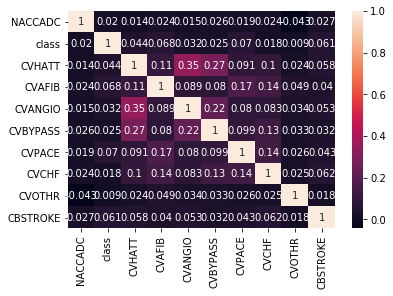

In [8]:
corr = df.corr().iloc[0:10,0:10]
import numpy as np 
from pandas import DataFrame
import seaborn as sns
%matplotlib inline

# Index= ['aaa', 'bbb', 'ccc', 'ddd', 'eee']
# Cols = ['A', 'B', 'C', 'D']
# df = DataFrame(abs(np.random.randn(5, 4)), index=Index, columns=Cols)

sns.heatmap(corr, annot=True)

In [9]:
#Dropping all descriptive(string) columns except for NACCID
df1=df.select_dtypes(include=['object'])
col_list=[x for x in df1.loc[:, df1.columns != 'NACCID']]
df=df.drop(col_list,axis=1)
print("After dropping string columns",len(df.columns))

After dropping string columns 252


In [10]:
#Dropping NPIQINF(NPI Informant)as this feature is not really needed.
df=df.drop(columns=['NPIQINF'],axis=1)
print("After dropping NPIQINF",len(df.columns))

After dropping NPIQINF 251


In [11]:
#Dropping columns which have the same value for all records
for col in df.columns:
    if len(df[col].unique()) == 1:
        df = df.drop(col,axis=1)
print("After dropping columns with same value",len(df.columns))

After dropping columns with same value 246


In [12]:
#Replacing out of range year values with mode
#df.LOGIDAY.replace([19,99],88,inplace=True)
#df.LOGIMO.replace([16,99],88,inplace=True)
#df.LOGIYR.replace([88,295,593,9999],9999,inplace=True)
#df['LOGIYR'].replace([593], np.nan,inplace=True)
#df['LOGIYR'].replace(np.nan,df.mode()['LOGIYR'][0],inplace=True)
# df['LOGIMO'].replace([16,99],np.nan,inplace=True)
# df['LOGIMO'].replace(np.nan,df.mode()['LOGIMO'][0],inplace=True)
# df['LOGIDAY'].replace([19,99],np.nan,inplace=True)
# df['LOGIDAY'].replace(np.nan,df.mode()['LOGIDAY'][0],inplace=True)
# df['LOGIYR'].replace([88,295,593,9999], np.nan,inplace=True)
# df['LOGIYR'].replace(np.nan,df.mode()['LOGIYR'][0],inplace=True)




In [13]:
df2=df.filter(regex='^(?!LOGIYR).*YR$')
df2=df2.round(0)
df2=df2.fillna(0)
df.update(df2)

In [14]:
#Setting values of variables that depend on some other variables
df.loc[df.CBSTROKE == 0, ['STROK1YR','STROK2YR','STROK3YR']] = 0
df.loc[df.CBTIA == 0, ['TIA1YR','TIA2YR','TIA3YR','TIA4YR']] = 0
df.loc[df.PD == 0, 'PDYR'] = 0
df.loc[df.PDOTHR == 0, 'PDOTHRYR'] = 0
df.loc[df.DEL == 0, 'DELSEV'] = 0
df.loc[df.HALL == 0, 'HALLSEV'] = 0
df.loc[df.DEPD == 0, 'DEPDSEV'] = 0
df.loc[df.ANX == 0, 'ANXSEV'] = 0
df.loc[df.ELAT == 0, 'ELATSEV'] = 0
df.loc[df.APA == 0, 'APASEV'] = 0
df.loc[df.DISN == 0, 'DISNSEV'] = 0
df.loc[df.IRR == 0, 'IRRSEV'] = 0
df.loc[df.MOT == 0, 'MOTSEV'] = 0
df.loc[df.NITE == 0, 'NITESEV'] = 0
df.loc[df.APP == 0, 'APPSEV'] = 0
cols =['DECAGE', 'COGMEM', 'COGJUDG', 'COGLANG', 'COGVIS', 'COGATTN', 'COGOTHR', 'COGFRST', 'COGMODE', 'BEAPATHY', 'BEDEP',
       'BEVHALL', 'BEAHALL', 'BEDEL', 'BEDISIN', 'BEIRRIT',
       'BEAGIT', 'BEPERCH',  'BEOTHR', 'BEFRST', 'BEMODE', 'MOGAIT',
       'MOFALLS', 'MOTREM', 'MOSLOW', 'MOFRST', 'MOMODE', 'COURSE',
       'FRSTCHG']
df.loc[df.DECCLIN == 0, cols] = 0
df.loc[df.VISCORR == 0, 'VISWCORR'] = 9
df.loc[df.HEARAID == 0, 'HEARWAID'] = 9
cols1=['SPEECH', 'FACEXP', 'TRESTFAC', 'TRESTRHD', 'TRESTLHD', 'TRESTRFT',
       'TRESTLFT', 'TRACTRHD', 'TRACTLHD', 'RIGDNECK', 'RIGDUPRT', 'RIGDUPLF',
       'RIGDLORT', 'RIGDLOLF', 'TAPSRT', 'TAPSLF', 'HANDMOVR', 'HANDMOVL',
       'HANDALTR', 'HANDALTL', 'LEGRT', 'LEGLF', 'ARISING', 'POSTURE', 'GAIT',
       'POSSTAB', 'BRADYKIN']
df.loc[df.PDNORMAL == 1, cols1] = 0

In [15]:
#Rounding up all fractional values to integers as these are categorical features.
df3=df[['CVHATT','CVAFIB','CVANGIO','CVBYPASS','CVPACE','CVCHF','CVOTHR','CBSTROKE','CBTIA','CBOTHR','PD','PDOTHR','SEIZURES','TRAUMBRF','TRAUMCHR','TRAUMEXT','NCOTHR','HYPERTEN','HYPERCHO','DIABETES','B12DEF','THYROID','INCONTU','INCONTF','DEP2YRS','DEPOTHR','ALCOHOL','TOBAC30','ABUSOTHR','PSYCDIS','HEARWAID']]
df3=df3.round(0)
df.update(df3)

In [60]:
#Imputing all remaining categorical and ordinal features with 0
df.VISWCORR = pd.to_numeric(df.VISWCORR, errors="coerce")
list=df.columns[df.isnull().any()].tolist()
df[list] = df[list].fillna(value=0)
df.to_csv("clean.csv")
df=df.apply(preprocessing.LabelEncoder().fit_transform)

In [90]:
X = df.loc[:,df.columns!='class']
y = df.loc[:,df.columns =='class']

In [91]:
df_for_plots = pd.read_csv("Alzheimers_Proj_DataSet_Original.csv",low_memory=False)

In [97]:
# check if there are continue valued columns in opur dataset spo that we can plot the 
continuous_column = []
l = ['MMSE', 'FORMVER','MOMONSET','MOMAGE','VEG','ANIMALS','CDRSUM','MOMDAGE','DADONSET','DADAGE','DADDAGE','SIBS','SIBSDEM','SIB1ONS','SIB1AGE','SIB2ONS','DECAGE','SIB2AGE','SIB3ONS','SIB3AGE','SIB4ONS','SIB4AGE','SIB5ONS','SIB5AGE','SIB6ONS','SIB6AGE','KIDS','KIDSDEM','KID1ONS','KID1AGE','KID2ONS','KID2AGE','KID3ONS','KID3AGE','KID4ONS','KID4AGE','KID5ONS','KID5AGE','KID6ONS','KID6AGE','PMAS','PMAF','PMAPF','PMBS','PMBF','PMBPF','PMCS','PMCF','PMCPF','PMDS','HEIGHT','WEIGHT','BPSYS','BPDIAS','HRATE','TRAILB','TRAILA','WAIS','MEMUNITS']
for i in l: 
    for j in df_for_plots.columns:
        if i == j:
            print(j)
            continuous_column.append(j)


MMSE
VEG
ANIMALS
CDRSUM
DECAGE
HEIGHT
WEIGHT
BPSYS
BPDIAS
HRATE
TRAILB
TRAILA
WAIS
MEMUNITS


In [98]:
df_for_plots[continuous_column].to_csv("continuous_column.csv")

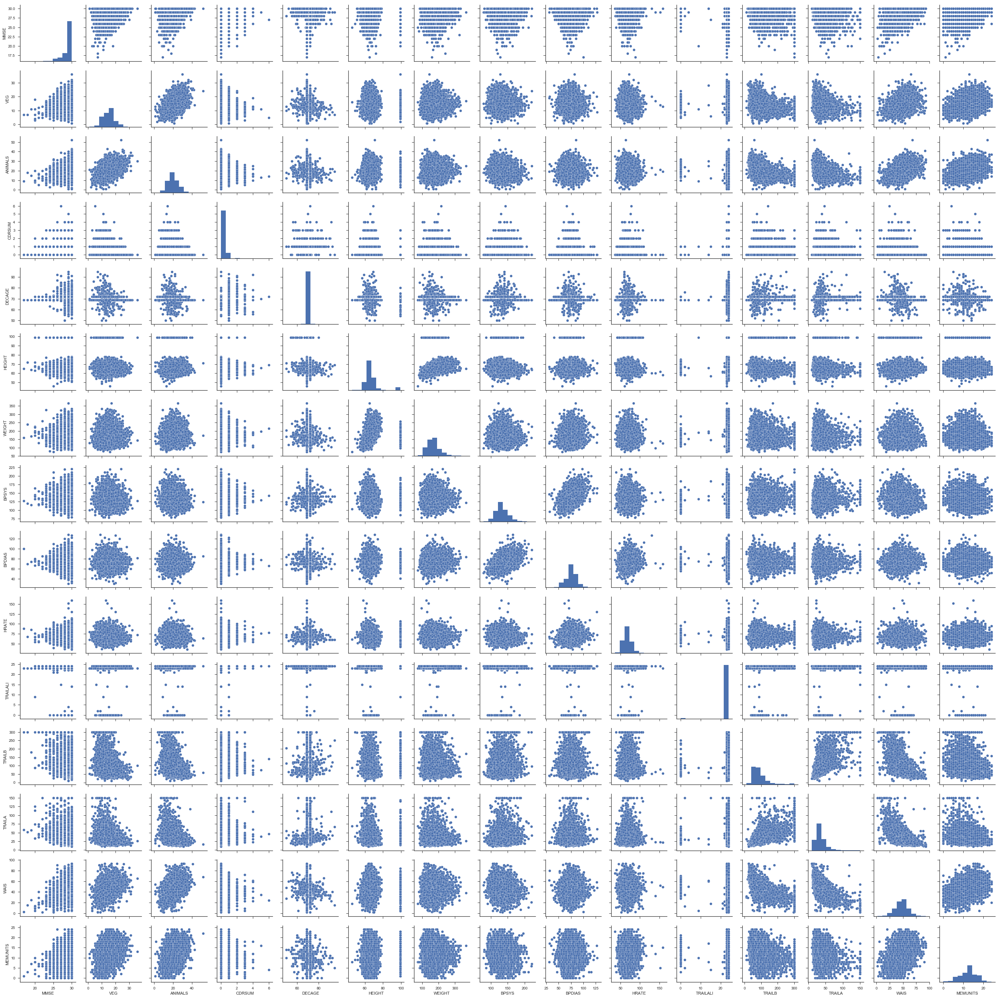

In [94]:
# Scatter plots for continuous data
import seaborn as sns; sns.set(style="ticks", color_codes=True)
g = sns.pairplot(df_for_plots[continuous_column])

In [105]:
# Scaling/Normalization

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler.fit(df[continuous_column])
df[continuous_column] = scaler.transform(df[continuous_column])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001F40711ABE0>,
      dtype=object)

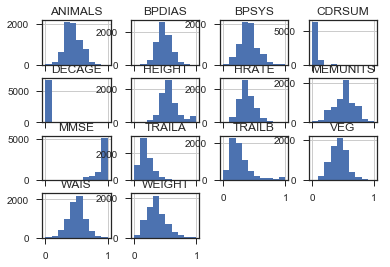

In [106]:
# Probability Distribution of all the continuous values columns
df[continuous_column].hist()

In [ ]:
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
# clf = SVC(gamma='auto',kernel = 'linear')
# clf.fit(X_train, y_train)

In [18]:
# y_train_pred=clf.predict(X_train)
# y_test_pred=clf.predict(X_test)
# print('Training Accuracy is : %.2f' %accuracy_score(y_train, y_train_pred))
# print('Test Accuracy is : %.2f' %accuracy_score(y_test, y_test_pred))

In [19]:
# from sklearn.metrics import roc_auc_score
# AUC_ROC = roc_auc_score(y_test, y_test_pred)
# print("Area under the curve for ROC is: "+ str(AUC_ROC))

In [20]:
#X = X.drop(columns=['HACHIN','FOCLSIGN','FOCLSYM','CVDCOG','QUITSMOK','SMOKYRS'])

# Correlation based independence check for columns (drop columns > 0.3)

In [22]:
corr = df.corr().iloc[:,:3]

l = corr['class']
for i in range(len(corr.index)):
    if abs(l[i])>0.3:
        print(corr.index[i], l[i])

In [21]:
def model(X,y):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
    from sklearn.tree import DecisionTreeClassifier
    tre = DecisionTreeClassifier()
    tre.fit(X_train, y_train)
    y_test_pred = tre.predict(X_test)
    y_train_pred = tre.predict(X_train)
    #y_score_train = tre.predict(X_test)
    #accuracy = clf.score(X_test,y_test)
    AUC_ROC = roc_auc_score(y_test, y_test_pred)
    #print("Accuracy is: "+ str(accuracy))

    print('Training Accuracy is : %.2f' %accuracy_score(y_train, y_train_pred))
    print('Test Accuracy is : %.2f' %accuracy_score(y_test, y_test_pred))
    print("Area under the curve for ROC is: "+ str(AUC_ROC))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x00000275093DEB00>]],
      dtype=object)

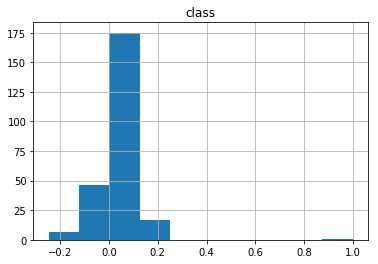

In [24]:
# Distribution of class/label/target
l = pd.DataFrame(l)
l.hist()

In [25]:
def k_best_features_names(X_new):
    mask = X_new.get_support() #list of booleans
    new_features = [] # The list of your K best features
    feature_names = X.columns
    for bool, feature in zip(mask, feature_names):
        if bool:
            new_features.append(feature)
    return new_features

In [26]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import SelectFpr
from sklearn.feature_selection import mutual_info_classif


In [27]:
#CHI BASED
#----------------------------------------------------
X_chi_20 = SelectKBest(chi2, k=20).fit(X, y)
X_chi_20_feature_names =  k_best_features_names(X_chi_20)
X_chi_20 = SelectKBest(chi2, k=20).fit_transform(X, y)

X_chi_30 = SelectKBest(chi2, k=30).fit(X, y)
X_chi_30_feature_names =  k_best_features_names(X_chi_30)
X_chi_30 = SelectKBest(chi2, k=30).fit_transform(X, y)


In [28]:
#f_classif ANOVA
#----------------------------------------------------
X_f_classif_20 = SelectKBest(f_classif, k=20).fit(X, y)
X_f_classif_20_feature_names =  k_best_features_names(X_f_classif_20)
X_f_classif_20 = SelectKBest(f_classif, k=20).fit_transform(X, y)

X_f_classif_30 = SelectKBest(f_classif, k=30).fit(X, y)
X_f_classif_30_feature_names =  k_best_features_names(X_f_classif_30)
X_f_classif_30 = SelectKBest(f_classif, k=30).fit_transform(X, y)


c:\users\pratikp\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [29]:
#mutual_info_classif
#----------------------------------------------------

X_mutual_info_classif_20 = SelectKBest(mutual_info_classif, k=20).fit(X, y)
X_mutual_info_classif_20_feature_names =  k_best_features_names(X_mutual_info_classif_20)
X_mutual_info_classif_20 = SelectKBest(mutual_info_classif, k=20).fit_transform(X, y)

X_mutual_info_classif_30 = SelectKBest(mutual_info_classif, k=30).fit(X, y)
X_mutual_info_classif_30_feature_names =  k_best_features_names(X_mutual_info_classif_30)
X_mutual_info_classif_30 = SelectKBest(mutual_info_classif, k=30).fit_transform(X, y)


c:\users\pratikp\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\users\pratikp\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\users\pratikp\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:578: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
c:\users\pratikp\appdata\local\programs\python\python36\lib\site-packages\sklearn\utils\validation.py:578: DataC

In [30]:
#PCA
#----------------------------------------------------
from sklearn.decomposition import PCA
pca = PCA(n_components=20)
X_pca_20 = pca.fit_transform(X)
print(X_pca_20.shape)

from sklearn.decomposition import PCA
pca = PCA(n_components=30)
X_pca_30 = pca.fit_transform(X)
print(X_pca_30.shape)

(7026, 20)
(7026, 30)


# check if final features are independent or not

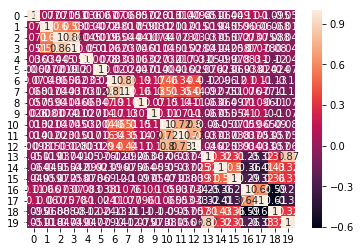

In [31]:
X_chi_20 = pd.DataFrame(X_chi_20)
corr = X_chi_20.corr()
import numpy as np 
from pandas import DataFrame
import seaborn as sns
%matplotlib inline
sns.heatmap(corr, annot=True)

In [32]:
corr

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,1.000000,0.077199,0.070967,0.051171,0.036307,0.006704,0.070120,0.068236,0.056535,0.025942,0.013348,0.014247,0.009804,-0.050760,-0.063762,-0.048545,0.107207,0.102793,-0.094728,-0.051443
1,0.077199,1.000000,0.601763,0.527125,0.034280,0.007193,0.048042,0.017460,0.059153,0.008147,0.021241,0.012383,0.014842,-0.018543,-0.045123,-0.058716,0.066154,0.060351,-0.068039,-0.018289
2,0.070967,0.601763,1.000000,0.864959,0.044728,0.001903,0.065484,0.043800,0.040604,0.007355,0.046857,0.023282,0.030471,-0.036729,-0.054654,-0.071901,0.072947,0.074525,-0.087555,-0.046740
3,0.051171,0.527125,0.864959,1.000000,0.050184,0.012084,0.062141,0.037112,0.045801,0.010741,0.044686,0.014711,0.027821,-0.041459,-0.042369,-0.058375,0.069646,0.077851,-0.079866,-0.049408
4,0.036307,0.034280,0.044728,0.050184,1.000000,0.007841,0.033072,0.031138,0.063080,0.027281,0.031910,0.017458,0.003056,-0.050365,-0.099414,-0.077604,0.083124,0.100146,-0.119253,-0.047119
5,0.006704,0.007193,0.001903,0.012084,0.007841,1.000000,0.020126,0.023519,0.047077,0.013988,0.004001,0.016370,0.029003,-0.076446,0.022677,-0.068910,-0.038366,-0.023760,-0.024066,-0.079476
6,0.070120,0.048042,0.065484,0.062141,0.033072,0.020126,1.000000,0.814780,0.186305,0.168754,0.461388,0.338007,0.399752,-0.118248,-0.096098,-0.122787,0.104790,0.111135,-0.127896,-0.135381
7,0.068236,0.017460,0.043800,0.037112,0.031138,0.023519,0.814780,1.000000,0.164852,0.127091,0.510356,0.349510,0.442793,-0.092353,-0.075058,-0.104106,0.075917,0.077087,-0.106215,-0.115410
8,0.056535,0.059153,0.040604,0.045801,0.063080,0.047077,0.186305,0.164852,1.000000,0.069605,0.146065,0.137632,0.108699,-0.063427,-0.064246,-0.096866,0.104801,0.096438,-0.112906,-0.074529
9,0.025942,0.008147,0.007355,0.010741,0.027281,0.013988,0.168754,0.127091,0.069605,1.000000,0.114422,0.071449,0.100496,-0.067003,-0.055288,-0.053720,0.100699,0.103762,-0.102341,-0.073031


# Feature selection

In [33]:
model(X_chi_20,y)
model(X_chi_30,y)
model(X_f_classif_20,y)
model(X_f_classif_30,y)
model(X_mutual_info_classif_20,y)
model(X_mutual_info_classif_30,y)

Training Accuracy is : 1.00
Test Accuracy is : 0.90
Area under the curve for ROC is: 0.808986769001661
Training Accuracy is : 1.00
Test Accuracy is : 0.88
Area under the curve for ROC is: 0.8009698913645302
Training Accuracy is : 1.00
Test Accuracy is : 0.77
Area under the curve for ROC is: 0.6099929358306126
Training Accuracy is : 1.00
Test Accuracy is : 0.89
Area under the curve for ROC is: 0.8087175668709549
Training Accuracy is : 1.00
Test Accuracy is : 0.91
Area under the curve for ROC is: 0.8393951543616474
Training Accuracy is : 1.00
Test Accuracy is : 0.89
Area under the curve for ROC is: 0.8101361284533288


# SVM RFE

In [ ]:
# import matplotlib.pyplot as plt
# from sklearn.svm import SVC
# from sklearn.model_selection import StratifiedKFold
# from sklearn.feature_selection import RFECV

# # Create the RFE object and compute a cross-validated score.
# svc = SVC(kernel="linear")
# # The "accuracy" scoring is proportional to the number of correct
# # classifications
# rfecv = RFECV(estimator=svc, step=1, cv=StratifiedKFold(2),
#               scoring='accuracy')
# rfecv.fit(X, y)

# print("Optimal number of features : %d" % rfecv.n_features_)

# # Plot number of features VS. cross-validation scores
# plt.figure()
# plt.xlabel("Number of features selected")
# plt.ylabel("Cross validation score (nb of correct classifications)")
# plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
# plt.show()

# T-SNE  Visualization of whole Dataset

[t-SNE] Computing 1 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.244s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 205.860229
[t-SNE] Error after 1000 iterations: 7.415858


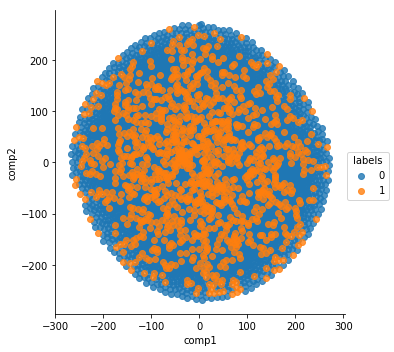

[t-SNE] Computing 4 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.285s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 95.482826
[t-SNE] Error after 1000 iterations: 1.664582


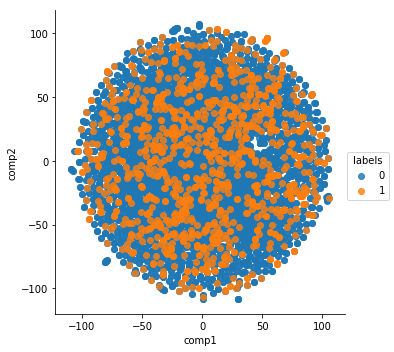

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.322s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 96.835175
[t-SNE] Error after 1000 iterations: 1.634706


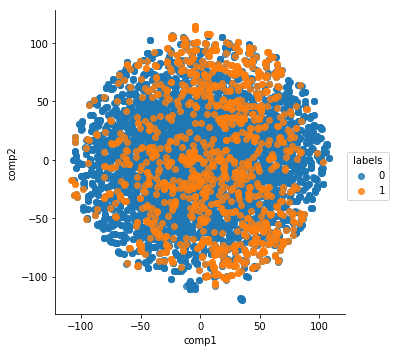

[t-SNE] Computing 10 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.364s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 95.776344
[t-SNE] Error after 1000 iterations: 1.663415


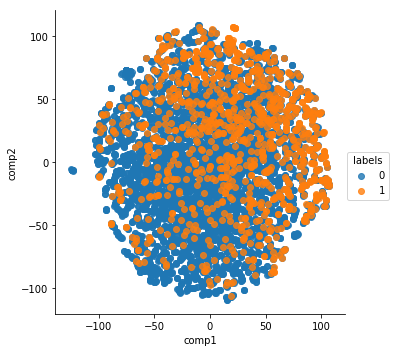

[t-SNE] Computing 13 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.017s...
[t-SNE] Computed neighbors for 7026 samples in 0.379s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 93.513435
[t-SNE] Error after 1000 iterations: 1.671517


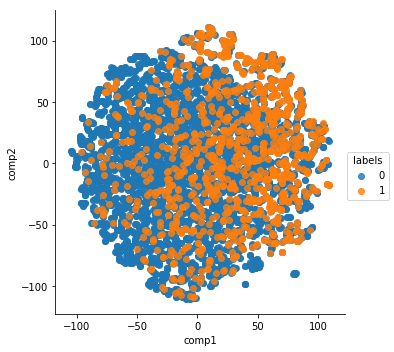

[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.387s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 92.168083
[t-SNE] Error after 1000 iterations: 1.684511


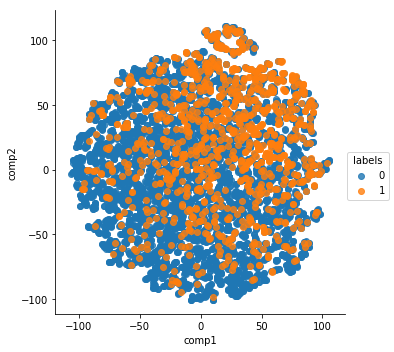

[t-SNE] Computing 19 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.405s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 91.450119
[t-SNE] Error after 1000 iterations: 1.689639


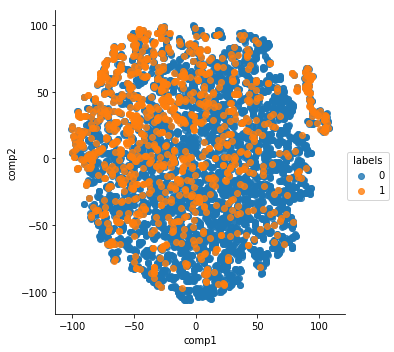

[t-SNE] Computing 22 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.407s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 90.949829
[t-SNE] Error after 1000 iterations: 1.699639


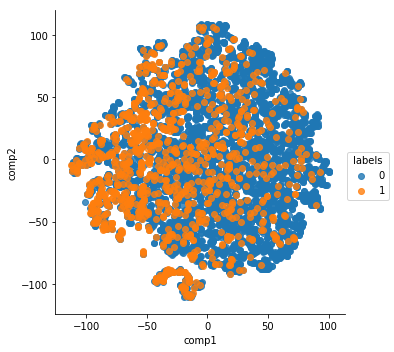

[t-SNE] Computing 25 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.015s...
[t-SNE] Computed neighbors for 7026 samples in 0.425s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.650032
[t-SNE] Error after 1000 iterations: 1.690650


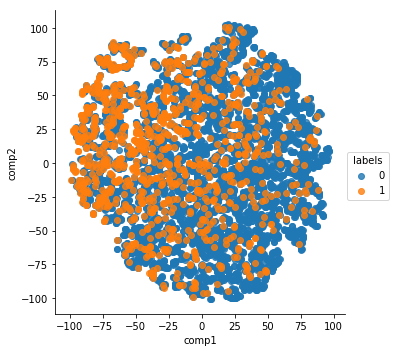

[t-SNE] Computing 28 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.438s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.232536
[t-SNE] Error after 1000 iterations: 1.693892


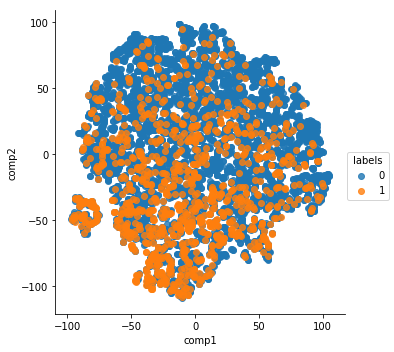

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.511s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.277992
[t-SNE] Error after 1000 iterations: 1.690454


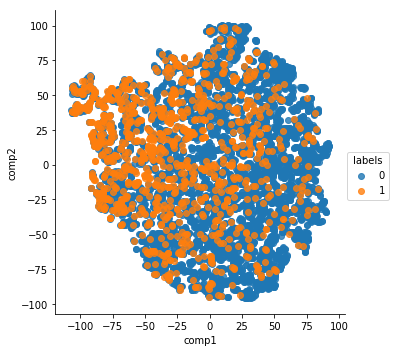

[t-SNE] Computing 34 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.015s...
[t-SNE] Computed neighbors for 7026 samples in 0.475s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.642563
[t-SNE] Error after 1000 iterations: 1.681056


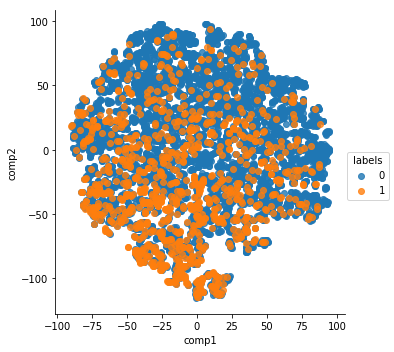

[t-SNE] Computing 37 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.015s...
[t-SNE] Computed neighbors for 7026 samples in 0.486s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 87.278625
[t-SNE] Error after 1000 iterations: 1.678500


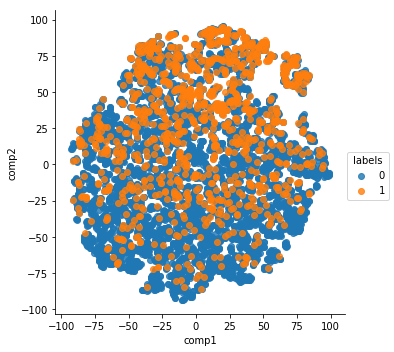

[t-SNE] Computing 40 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.496s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 86.561981
[t-SNE] Error after 1000 iterations: 1.674959


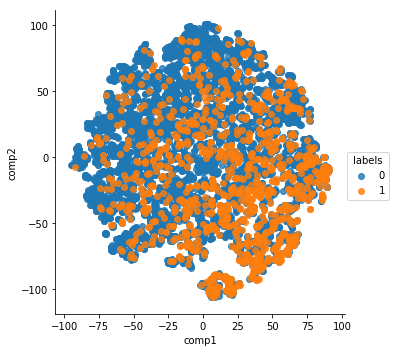

[t-SNE] Computing 43 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.593s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.962059
[t-SNE] Error after 1000 iterations: 1.670841


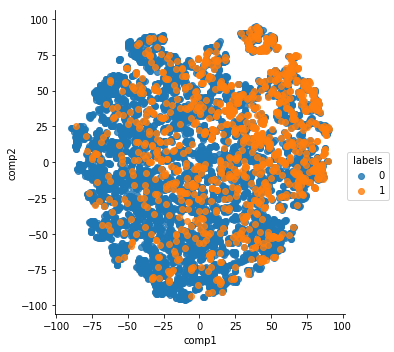

[t-SNE] Computing 46 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.523s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 85.416809
[t-SNE] Error after 1000 iterations: 1.669259


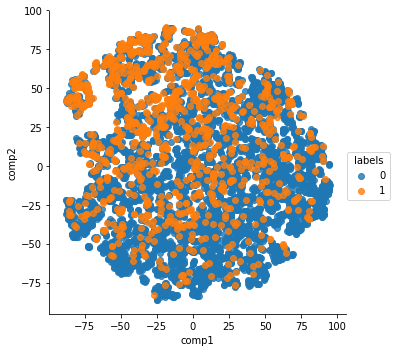

[t-SNE] Computing 49 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.628s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.950119
[t-SNE] Error after 1000 iterations: 1.660638


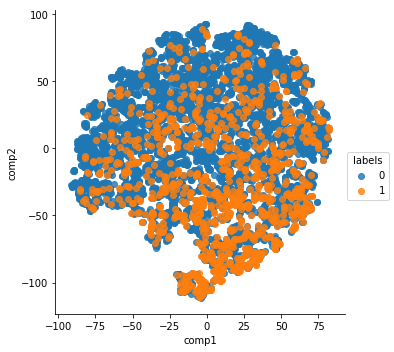

[t-SNE] Computing 52 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.523s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.466858
[t-SNE] Error after 1000 iterations: 1.659781


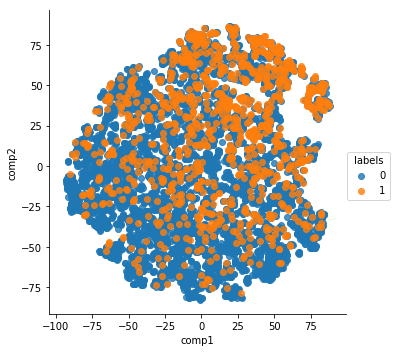

[t-SNE] Computing 55 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.550s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 84.044182
[t-SNE] Error after 1000 iterations: 1.653777


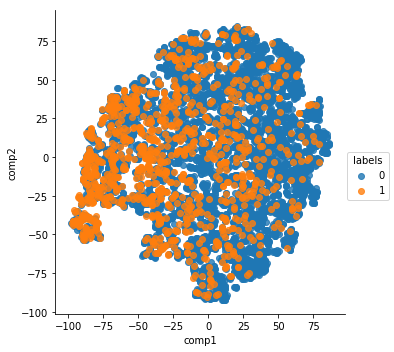

[t-SNE] Computing 58 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.547s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.628448
[t-SNE] Error after 1000 iterations: 1.647869


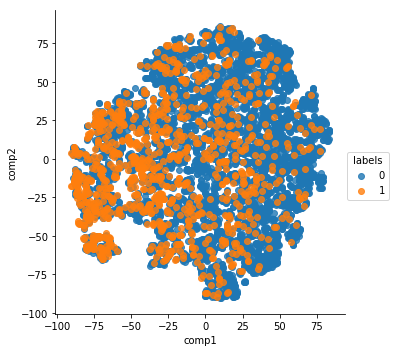

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.560s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.231186
[t-SNE] Error after 1000 iterations: 1.645896


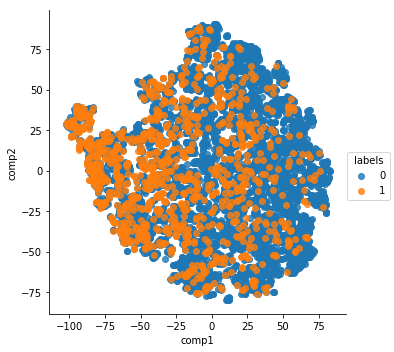

[t-SNE] Computing 64 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.015s...
[t-SNE] Computed neighbors for 7026 samples in 0.688s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.858238
[t-SNE] Error after 1000 iterations: 1.638990


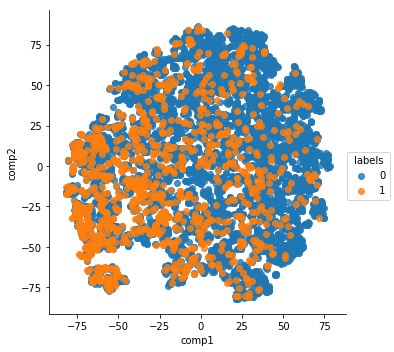

[t-SNE] Computing 67 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.029s...
[t-SNE] Computed neighbors for 7026 samples in 0.593s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.492981
[t-SNE] Error after 1000 iterations: 1.629564


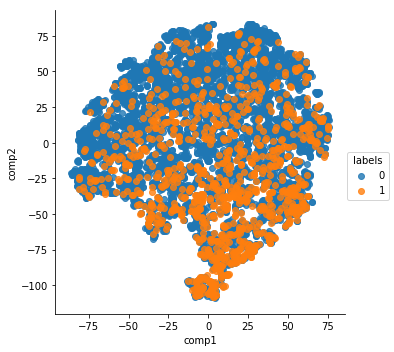

[t-SNE] Computing 70 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 0.672s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.136597
[t-SNE] Error after 1000 iterations: 1.622995


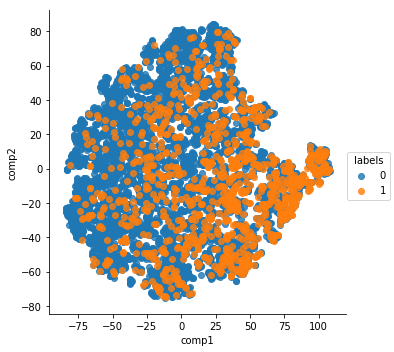

[t-SNE] Computing 73 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.015s...
[t-SNE] Computed neighbors for 7026 samples in 0.676s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.790031
[t-SNE] Error after 1000 iterations: 1.618201


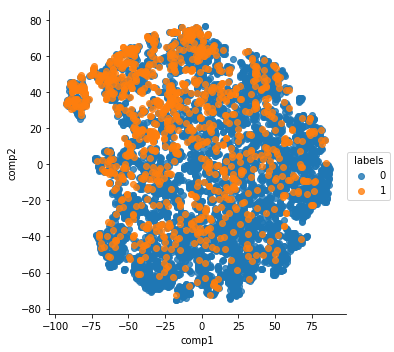

[t-SNE] Computing 76 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.657s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.495819
[t-SNE] Error after 1000 iterations: 1.614561


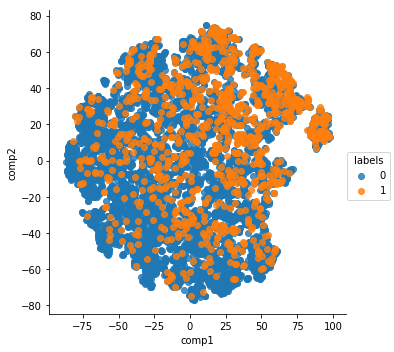

[t-SNE] Computing 79 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.830s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 81.174446
[t-SNE] Error after 1000 iterations: 1.607948


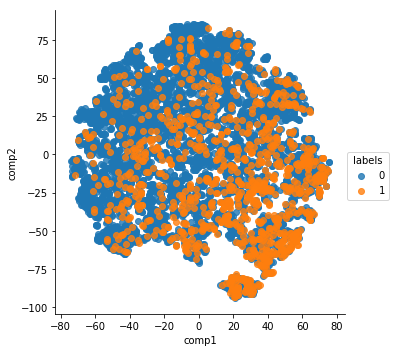

[t-SNE] Computing 82 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.656s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.851616
[t-SNE] Error after 1000 iterations: 1.599441


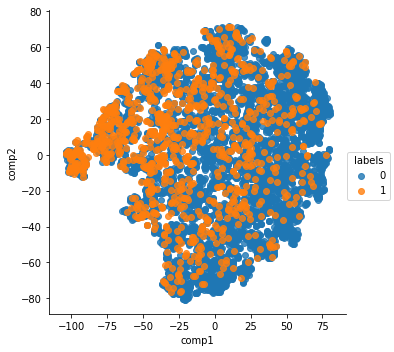

[t-SNE] Computing 85 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.662s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.540619
[t-SNE] Error after 1000 iterations: 1.596889


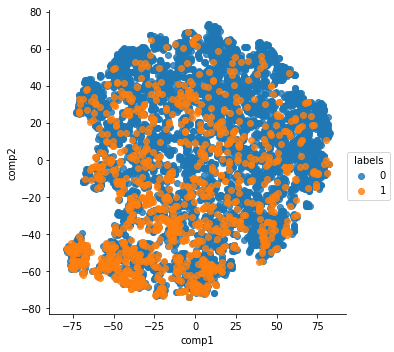

[t-SNE] Computing 88 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 0.643s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 80.278595
[t-SNE] Error after 1000 iterations: 1.589568


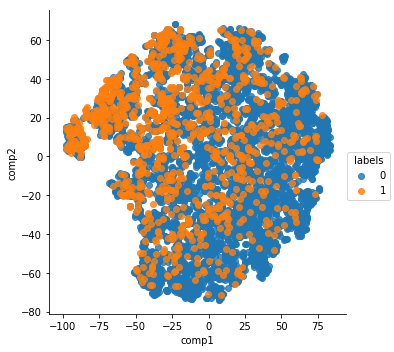

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 0.664s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.994415
[t-SNE] Error after 1000 iterations: 1.589376


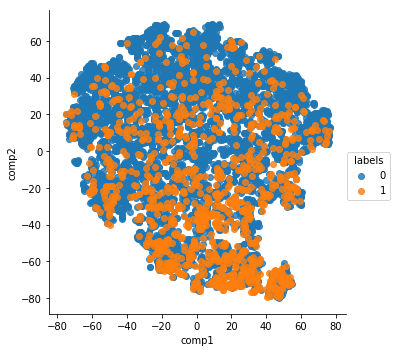

[t-SNE] Computing 94 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.672s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.711105
[t-SNE] Error after 1000 iterations: 1.579389


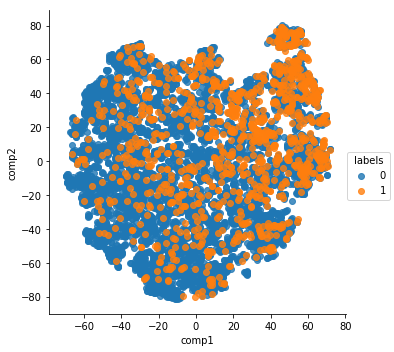

[t-SNE] Computing 97 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 0.731s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.450638
[t-SNE] Error after 1000 iterations: 1.573875


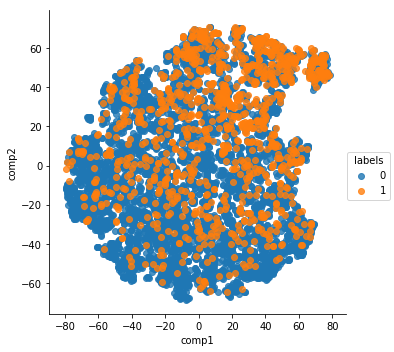

[t-SNE] Computing 100 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 0.873s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.211784
[t-SNE] Error after 1000 iterations: 1.569218


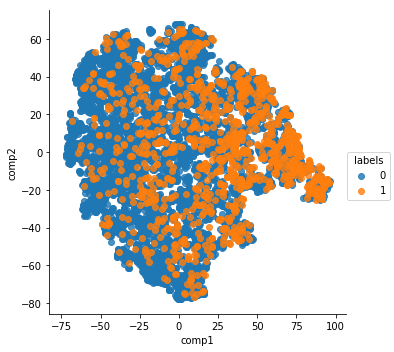

[t-SNE] Computing 103 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 0.696s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.948212
[t-SNE] Error after 1000 iterations: 1.563030


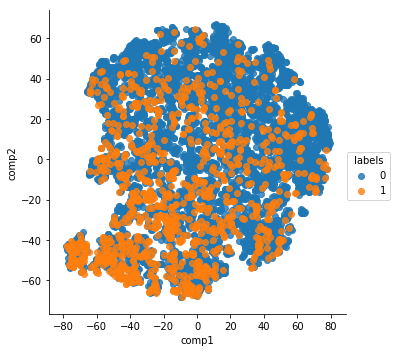

[t-SNE] Computing 106 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 0.678s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.713242
[t-SNE] Error after 1000 iterations: 1.562711


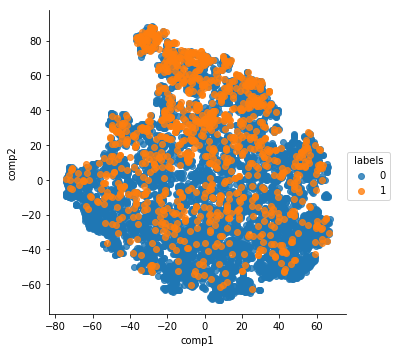

[t-SNE] Computing 109 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 0.700s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.473434
[t-SNE] Error after 1000 iterations: 1.556239


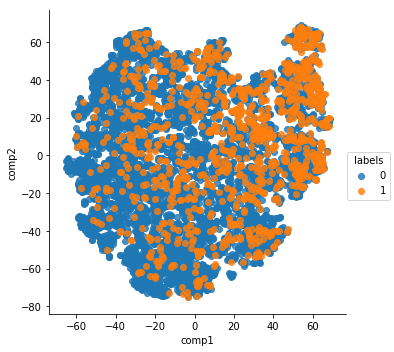

[t-SNE] Computing 112 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 0.708s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.259659
[t-SNE] Error after 1000 iterations: 1.547673


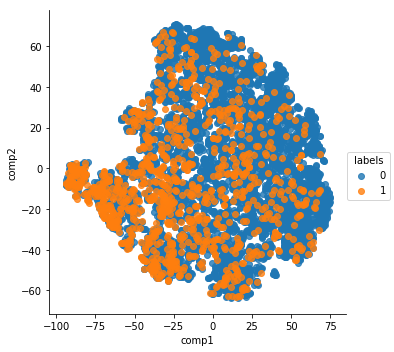

[t-SNE] Computing 115 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.726s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.036835
[t-SNE] Error after 1000 iterations: 1.543535


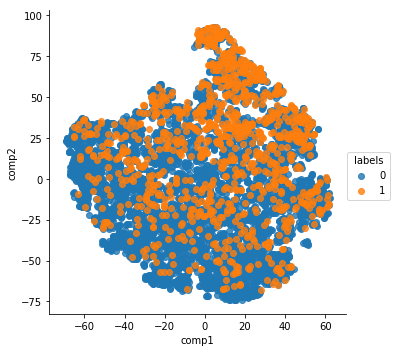

[t-SNE] Computing 118 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 0.720s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.814682
[t-SNE] Error after 1000 iterations: 1.540339


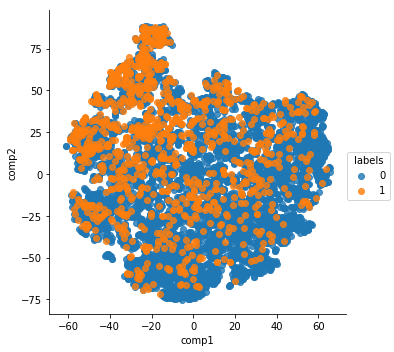

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.734s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.598068
[t-SNE] Error after 1000 iterations: 1.535629


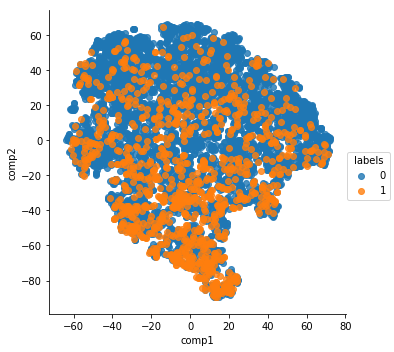

[t-SNE] Computing 124 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.749s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.384232
[t-SNE] Error after 1000 iterations: 1.528850


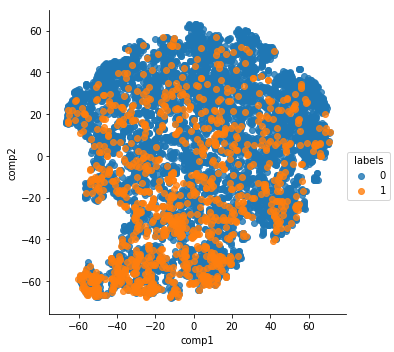

[t-SNE] Computing 127 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.824s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.185097
[t-SNE] Error after 1000 iterations: 1.523638


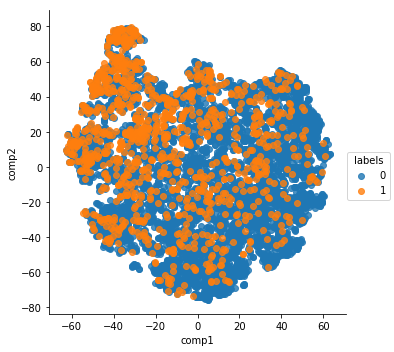

[t-SNE] Computing 130 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.763s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.984726
[t-SNE] Error after 1000 iterations: 1.522571


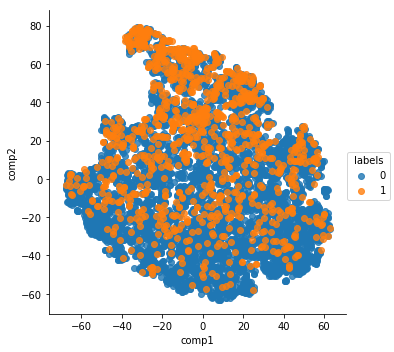

[t-SNE] Computing 133 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.791s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.790176
[t-SNE] Error after 1000 iterations: 1.517786


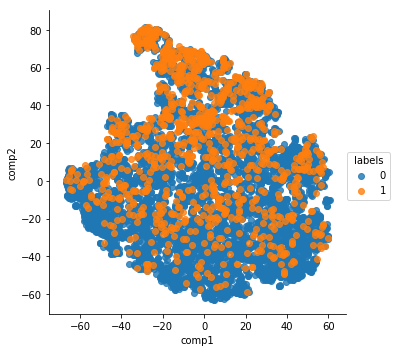

[t-SNE] Computing 136 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.805s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.588753
[t-SNE] Error after 1000 iterations: 1.509673


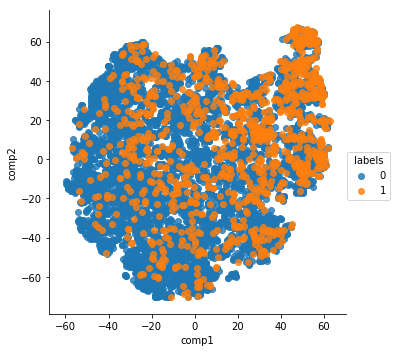

[t-SNE] Computing 139 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 1.141s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.423515
[t-SNE] Error after 1000 iterations: 1.502494


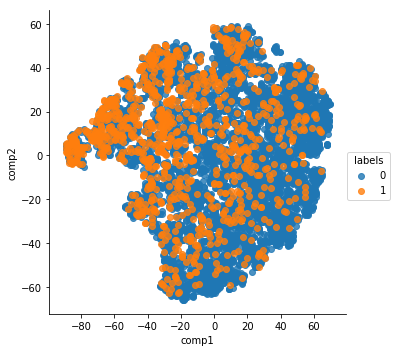

[t-SNE] Computing 142 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.823s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.230011
[t-SNE] Error after 1000 iterations: 1.498739


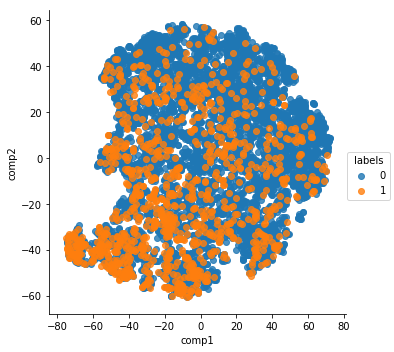

[t-SNE] Computing 145 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.826s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.063110
[t-SNE] Error after 1000 iterations: 1.493710


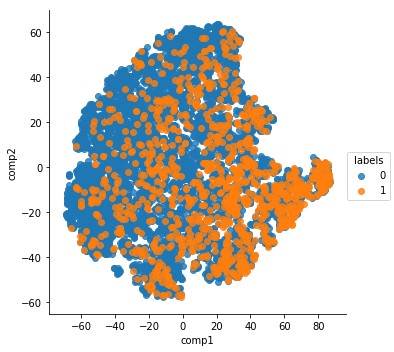

[t-SNE] Computing 148 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.015s...
[t-SNE] Computed neighbors for 7026 samples in 0.817s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.876312
[t-SNE] Error after 1000 iterations: 1.492896


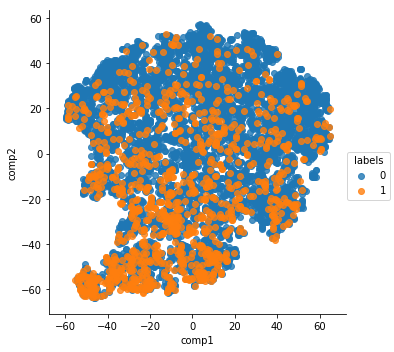

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.950s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.704453
[t-SNE] Error after 1000 iterations: 1.485057


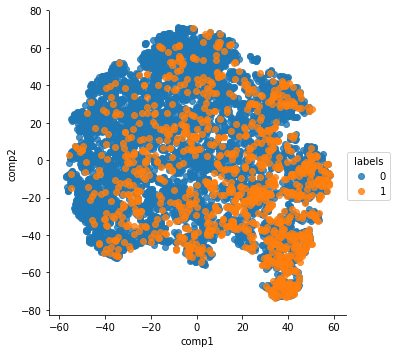

[t-SNE] Computing 154 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 1.002s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.539009
[t-SNE] Error after 1000 iterations: 1.484011


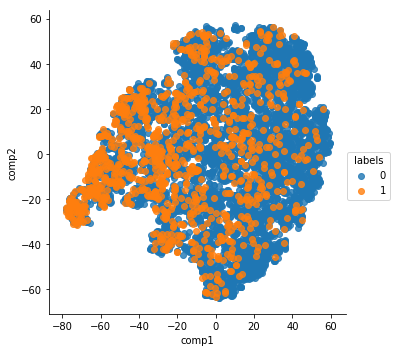

[t-SNE] Computing 157 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.858s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.368408
[t-SNE] Error after 1000 iterations: 1.480925


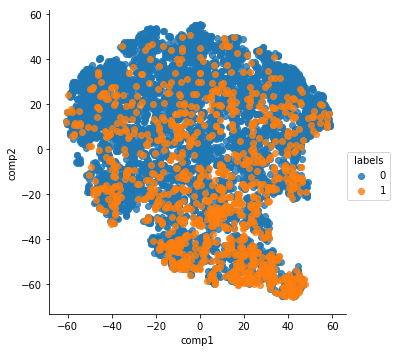

[t-SNE] Computing 160 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.868s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.208092
[t-SNE] Error after 1000 iterations: 1.474825


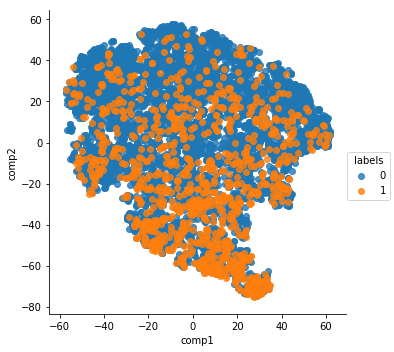

[t-SNE] Computing 163 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.892s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.037079
[t-SNE] Error after 1000 iterations: 1.467919


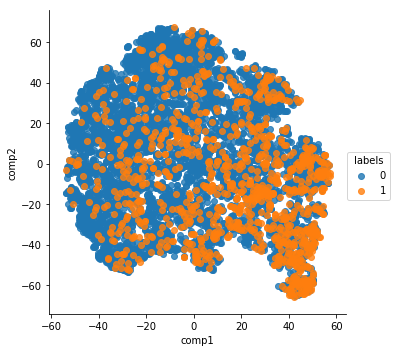

[t-SNE] Computing 166 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.883s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.897957
[t-SNE] Error after 1000 iterations: 1.462646


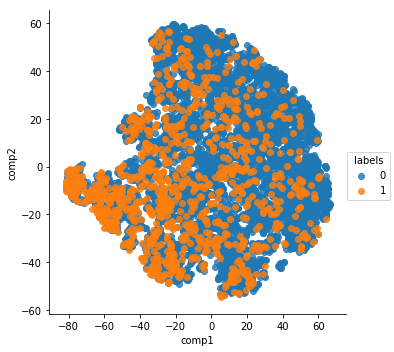

[t-SNE] Computing 169 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.906s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.740372
[t-SNE] Error after 1000 iterations: 1.458674


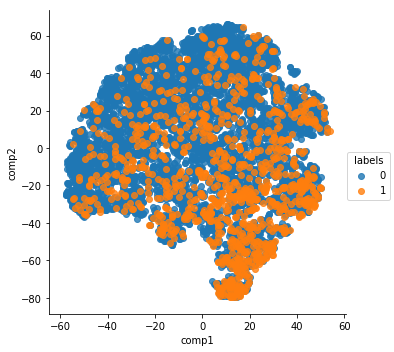

[t-SNE] Computing 172 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.017s...
[t-SNE] Computed neighbors for 7026 samples in 1.137s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.576553
[t-SNE] Error after 1000 iterations: 1.458907


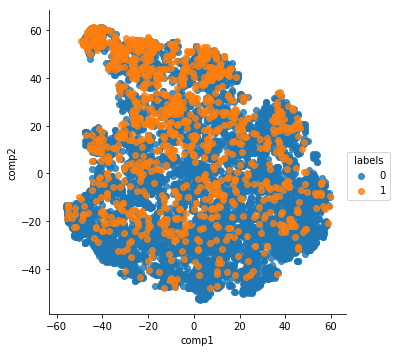

[t-SNE] Computing 175 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 1.191s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.434166
[t-SNE] Error after 1000 iterations: 1.451339


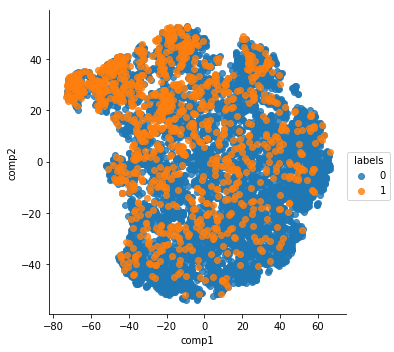

[t-SNE] Computing 178 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.920s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.291237
[t-SNE] Error after 1000 iterations: 1.445512


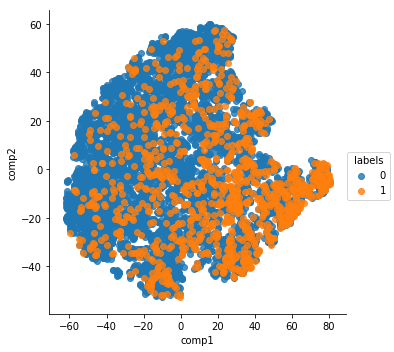

[t-SNE] Computing 181 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.901s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 74.138924
[t-SNE] Error after 1000 iterations: 1.441784


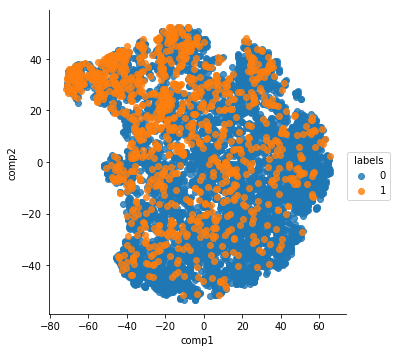

[t-SNE] Computing 184 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.933s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 2.188815
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.997795
[t-SNE] Error after 1000 iterations: 1.441813


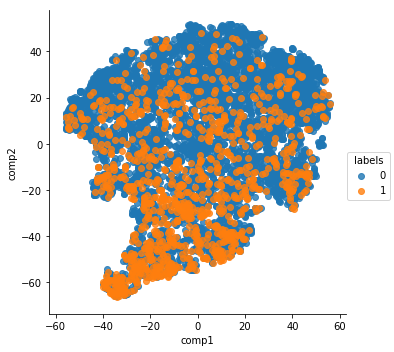

[t-SNE] Computing 187 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.921s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 3.987250
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.859322
[t-SNE] Error after 1000 iterations: 1.433428


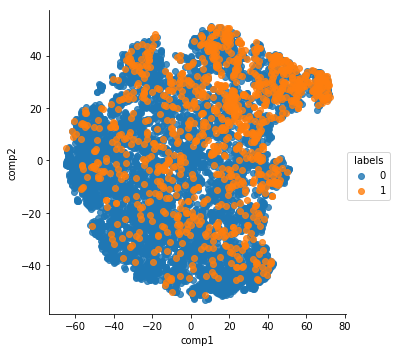

[t-SNE] Computing 190 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.934s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 4.467523
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.724464
[t-SNE] Error after 1000 iterations: 1.428424


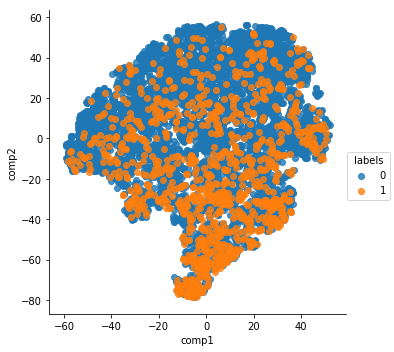

[t-SNE] Computing 193 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 0.951s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 4.689386
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.584396
[t-SNE] Error after 1000 iterations: 1.423956


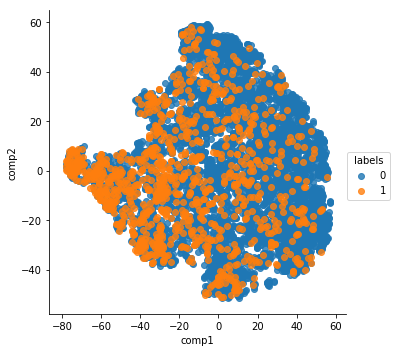

[t-SNE] Computing 196 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 0.943s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 4.865067
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.450211
[t-SNE] Error after 1000 iterations: 1.421062


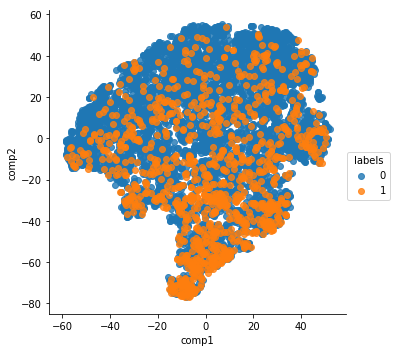

[t-SNE] Computing 199 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.015s...
[t-SNE] Computed neighbors for 7026 samples in 0.942s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.015145
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.315392
[t-SNE] Error after 1000 iterations: 1.417111


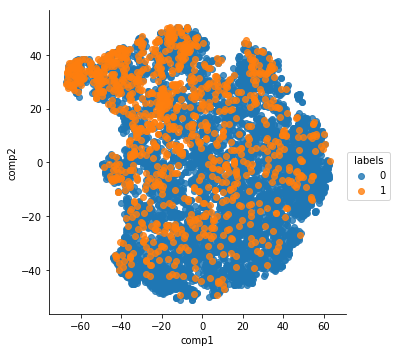

[t-SNE] Computing 202 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.016s...
[t-SNE] Computed neighbors for 7026 samples in 1.175s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.148891
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.182655
[t-SNE] Error after 1000 iterations: 1.413972


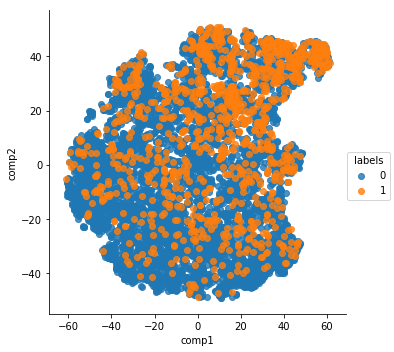

[t-SNE] Computing 205 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.045s...
[t-SNE] Computed neighbors for 7026 samples in 0.934s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.271499
[t-SNE] KL divergence after 250 iterations with early exaggeration: 73.064026
[t-SNE] Error after 1000 iterations: 1.408382


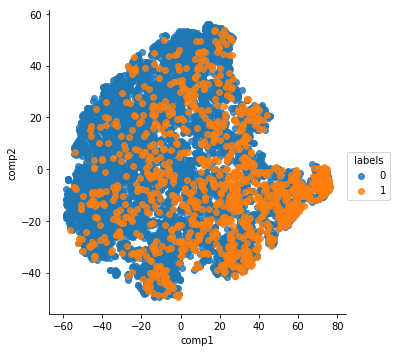

[t-SNE] Computing 208 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 0.944s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.386306
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.936172
[t-SNE] Error after 1000 iterations: 1.408128


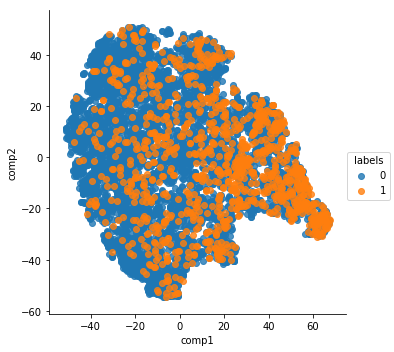

[t-SNE] Computing 211 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 0.942s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.495385
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.809219
[t-SNE] Error after 1000 iterations: 1.400494


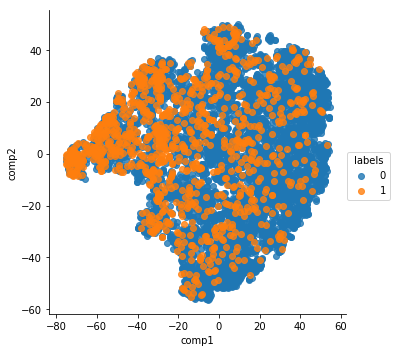

[t-SNE] Computing 214 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.971s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.600476
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.689095
[t-SNE] Error after 1000 iterations: 1.396958


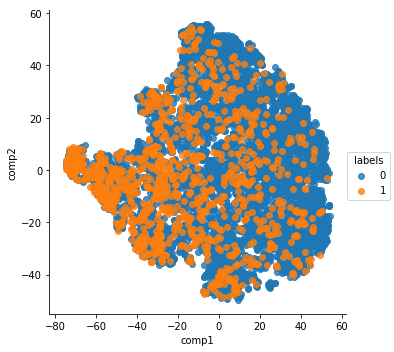

[t-SNE] Computing 217 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 0.999s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.702606
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.568314
[t-SNE] Error after 1000 iterations: 1.393023


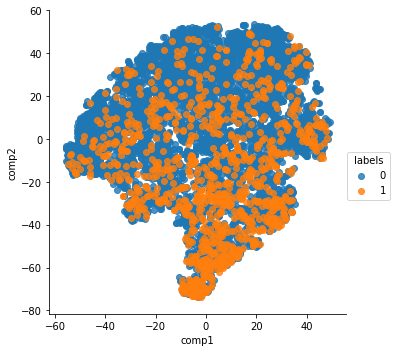

[t-SNE] Computing 220 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 1.036s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.802597
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.449089
[t-SNE] Error after 1000 iterations: 1.390059


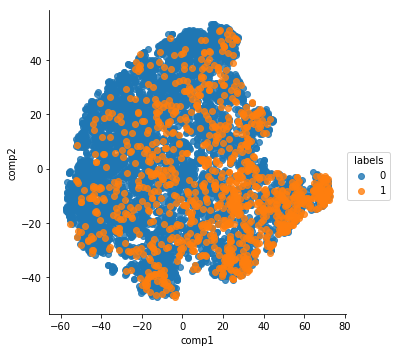

[t-SNE] Computing 223 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 0.999s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.901247
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.327431
[t-SNE] Error after 1000 iterations: 1.390714


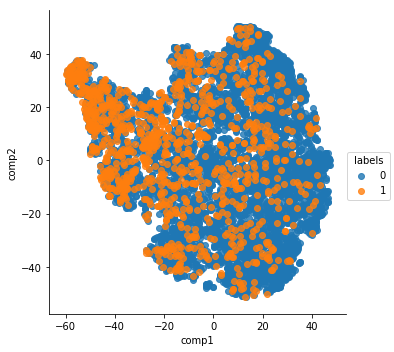

[t-SNE] Computing 226 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 0.999s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 5.998976
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.207367
[t-SNE] Error after 1000 iterations: 1.383744


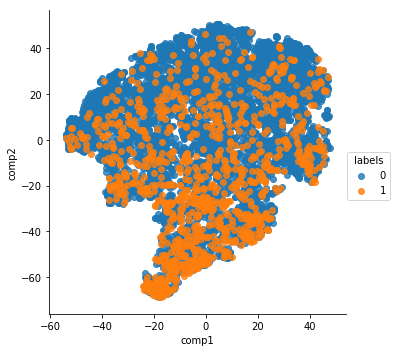

[t-SNE] Computing 229 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 1.004s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.095879
[t-SNE] KL divergence after 250 iterations with early exaggeration: 72.081062
[t-SNE] Error after 1000 iterations: 1.382193


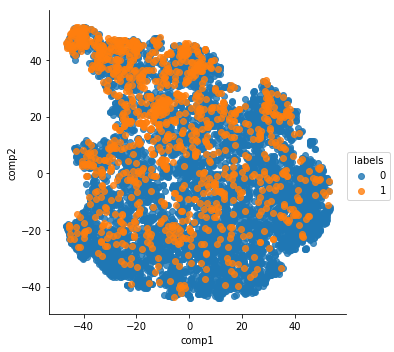

[t-SNE] Computing 232 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 1.243s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.191832
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.979393
[t-SNE] Error after 1000 iterations: 1.375692


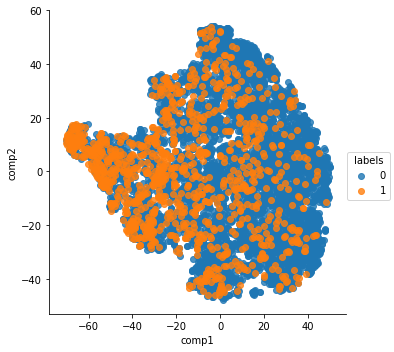

[t-SNE] Computing 235 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 1.082s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.285964
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.868057
[t-SNE] Error after 1000 iterations: 1.371910


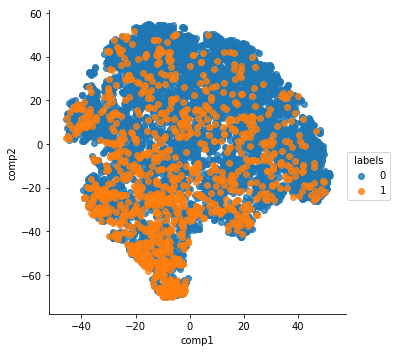

[t-SNE] Computing 238 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.014s...
[t-SNE] Computed neighbors for 7026 samples in 1.300s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.376503
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.760483
[t-SNE] Error after 1000 iterations: 1.368501


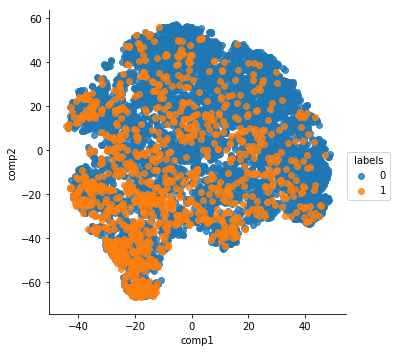

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 1.138s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.461223
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.642044
[t-SNE] Error after 1000 iterations: 1.365336


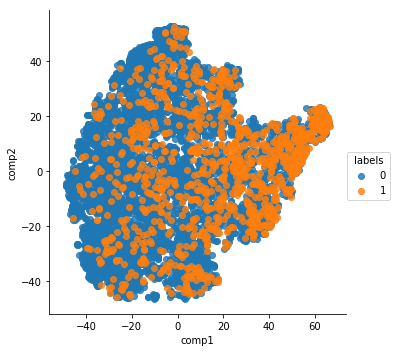

[t-SNE] Computing 244 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 1.057s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.537996
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.534538
[t-SNE] Error after 1000 iterations: 1.364722


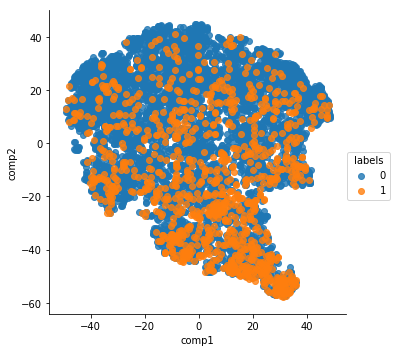

[t-SNE] Computing 247 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 1.086s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.606102
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.419281
[t-SNE] Error after 1000 iterations: 1.361014


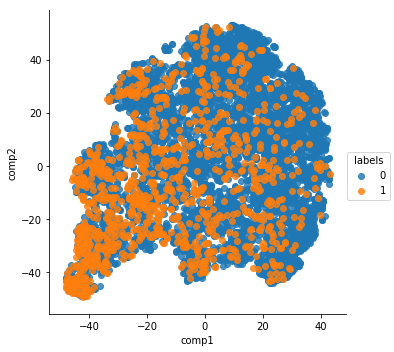

[t-SNE] Computing 250 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 1.412s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.666115
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.328819
[t-SNE] Error after 1000 iterations: 1.354364


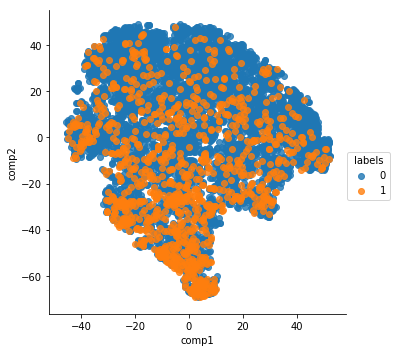

[t-SNE] Computing 253 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 1.059s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.719117
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.220543
[t-SNE] Error after 1000 iterations: 1.351056


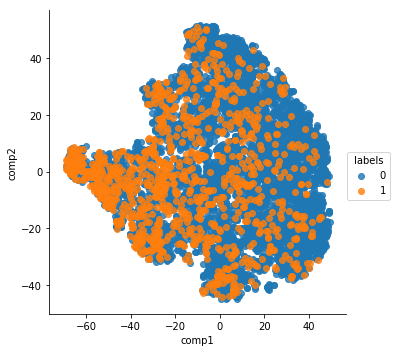

[t-SNE] Computing 256 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 1.084s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.766306
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.121422
[t-SNE] Error after 1000 iterations: 1.351138


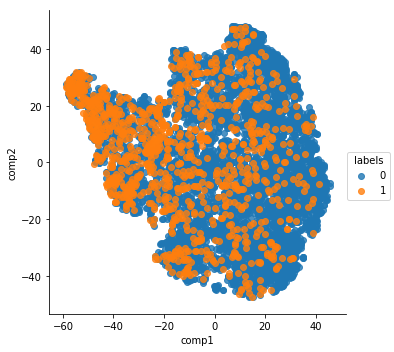

[t-SNE] Computing 259 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 1.274s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.808618
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.021362
[t-SNE] Error after 1000 iterations: 1.344215


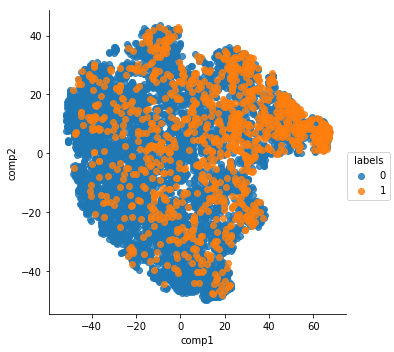

[t-SNE] Computing 262 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 1.202s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.846953
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.906235
[t-SNE] Error after 1000 iterations: 1.342766


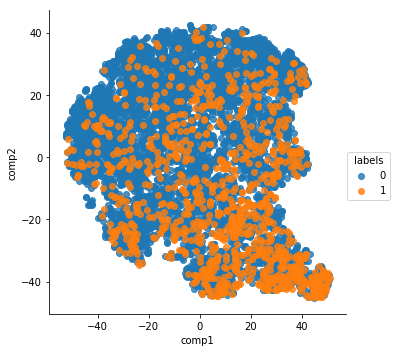

[t-SNE] Computing 265 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 1.098s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.881963
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.818939
[t-SNE] Error after 1000 iterations: 1.341178


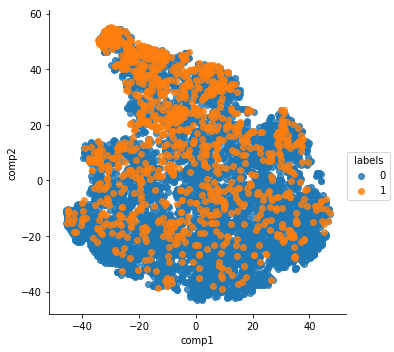

[t-SNE] Computing 268 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 1.138s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.914179
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.721512
[t-SNE] Error after 1000 iterations: 1.334291


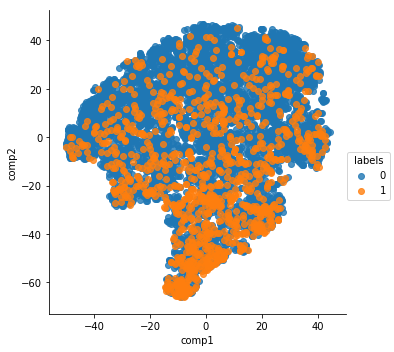

[t-SNE] Computing 271 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.013s...
[t-SNE] Computed neighbors for 7026 samples in 1.118s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.944069
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.623116
[t-SNE] Error after 1000 iterations: 1.332336


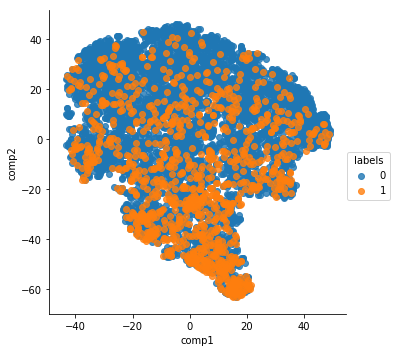

[t-SNE] Computing 274 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 1.105s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.971912
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.521919
[t-SNE] Error after 1000 iterations: 1.329031


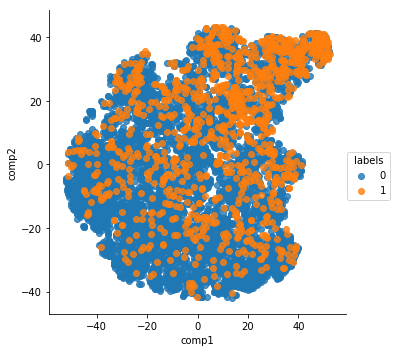

[t-SNE] Computing 277 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.010s...
[t-SNE] Computed neighbors for 7026 samples in 1.131s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 6.997987
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.433197
[t-SNE] Error after 1000 iterations: 1.326770


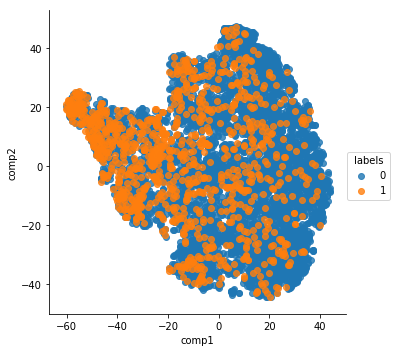

[t-SNE] Computing 280 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 1.122s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 7.022528
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.339493
[t-SNE] Error after 1000 iterations: 1.326036


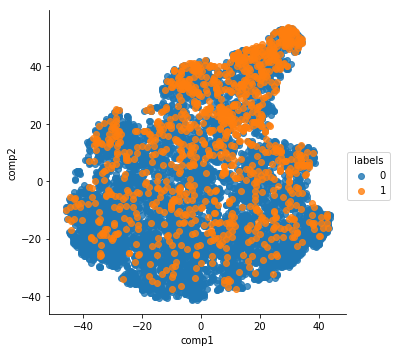

[t-SNE] Computing 283 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 1.175s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 7.045644
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.253525
[t-SNE] Error after 1000 iterations: 1.318092


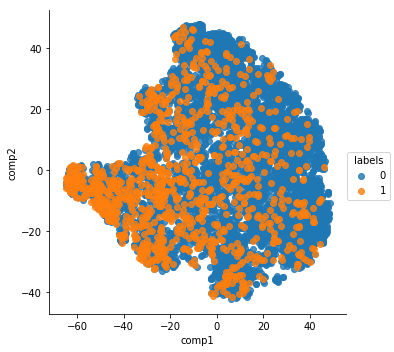

[t-SNE] Computing 286 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.012s...
[t-SNE] Computed neighbors for 7026 samples in 1.359s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 7.067502
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.153923
[t-SNE] Error after 1000 iterations: 1.318897


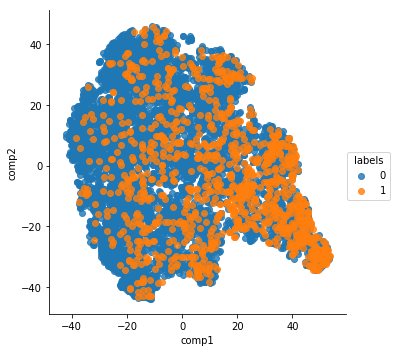

[t-SNE] Computing 289 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.011s...
[t-SNE] Computed neighbors for 7026 samples in 1.251s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 7.088226
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.068726
[t-SNE] Error after 1000 iterations: 1.312580


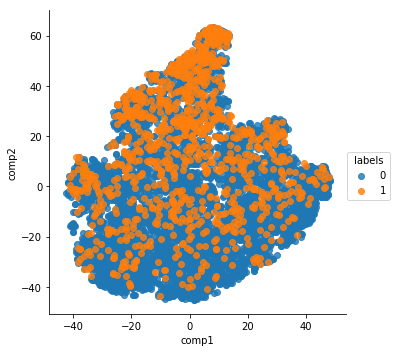

[t-SNE] Computing 292 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.016s...
[t-SNE] Computed neighbors for 7026 samples in 1.280s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 7.107883
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.981346
[t-SNE] Error after 1000 iterations: 1.311614


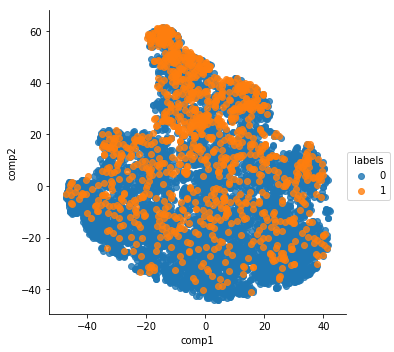

[t-SNE] Computing 295 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.015s...
[t-SNE] Computed neighbors for 7026 samples in 1.336s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 7.126564
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.891624
[t-SNE] Error after 1000 iterations: 1.307581


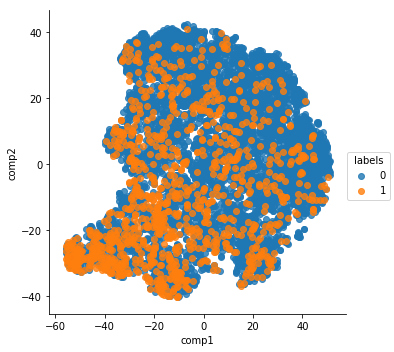

[t-SNE] Computing 298 nearest neighbors...
[t-SNE] Indexed 7026 samples in 0.017s...
[t-SNE] Computed neighbors for 7026 samples in 1.610s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7026
[t-SNE] Computed conditional probabilities for sample 2000 / 7026
[t-SNE] Computed conditional probabilities for sample 3000 / 7026
[t-SNE] Computed conditional probabilities for sample 4000 / 7026
[t-SNE] Computed conditional probabilities for sample 5000 / 7026
[t-SNE] Computed conditional probabilities for sample 6000 / 7026
[t-SNE] Computed conditional probabilities for sample 7000 / 7026
[t-SNE] Computed conditional probabilities for sample 7026 / 7026
[t-SNE] Mean sigma: 7.144347
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.808472
[t-SNE] Error after 1000 iterations: 1.304734


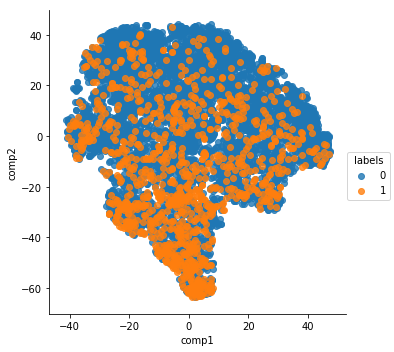

In [27]:
# import seaborn as sns
# from sklearn.manifold import TSNE
# import matplotlib.pyplot as plt
# n_sne = 1000
# for i in range(100):
#     tsne = TSNE(n_components=2,verbose=1,perplexity=i,n_iter=1000)
#     X_tsne = tsne.fit_transform(X_chi_20)
#     Xf = pd.DataFrame(X_tsne)
#     Xf.columns = ["comp1","comp2"]
#     Xf['labels'] = y
#     sns.lmplot("comp1","comp2",hue="labels",data=Xf,fit_reg=False)
#     plt.show()

